In [1]:
from datasets import BIMCVCOVIDDataset, PadChestDataset, BIMCVNegativeDataset, GitHubCOVIDDataset, ChestXray14Dataset

seed = 42

pos_ds = BIMCVCOVIDDataset(fold='val', labels='chestx-ray14', random_state=seed)
neg_ds = BIMCVNegativeDataset(fold='val', labels='chestx-ray14', random_state=seed)
padchest_ds = PadChestDataset(fold='val', labels='chestx-ray14', random_state=seed)
github_ds = GitHubCOVIDDataset(fold='val', labels='chestx-ray14', random_state=seed)
chestxray14_ds = ChestXray14Dataset(fold='val', labels='chestx-ray14', random_state=seed)

/home/janfidor/Programming/Research/cxr_covid/datasets/githubcovid.py:95: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  new_df.iloc[i]['COVID'] = 1
/home/janfidor/Programming/Research/cxr_covid/datasets/githubcovid.py:97: FutureWarning: Chai

In [2]:
from load_data import load_dataset_3

aug = 'random_crop-strong'
aug_name = f'{aug}-forced'
ds_train = load_dataset_3(seed, is_train=True, augments_name=aug_name, preprocessing='crop_pad-0.8', split_name='42')
ds_val = load_dataset_3(seed, is_train=False, augments_name=aug_name, preprocessing='crop_pad-0.9', split_name='42')

/home/janfidor/anaconda3/envs/cxr_covid/lib/python3.12/site-packages/torchxrayvision/utils.py:11: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [3]:
ds_train.get_all_labels()[:, -1].sum(), len(ds_train)

(1564.0, 4396)

In [4]:
ds_val.get_all_labels()[:, -1].sum(), len(ds_val)

(70.0, 254)

In [5]:
from utils import denormalize_image, get_preprocessing
import matplotlib.pyplot as plt

def show_image(image, title, ax=None):
    """Display an image on a given matplotlib axis with label and path info
    
    Args:
        image (torch.Tensor): Image tensor in CxHxW format
        title (str): Title of the image
        ax (matplotlib.axes.Axes, optional): Axis to plot on. If None, uses current axis
    """
    if ax is None:
        ax = plt.gca()
    
    ax.imshow(denormalize_image(image))
    ax.set_title(title)
    ax.axis('off')

def visualize_deterministic_transform(img, transform, intensities, preprocessing):
    _, axes = plt.subplots(2, len(intensities) // 2, figsize=(12, 12))
    axes = axes.ravel()

    # Show images from different datasets
    for i, v in enumerate(intensities):
        img_ = preprocessing(img)
        img_ = transform(img_, v)
        show_image(img_, v, axes[i])

    plt.tight_layout()


def example_borders(image, intensity1, intensity2, intensity3):
    new_img = image.clone()
    def apply_border(img, intensity, loc):
        pxs = int(224 * (1- intensity) // 2)

        img[loc, pxs:(224 - pxs), pxs] = 255
        img[loc, pxs:(224 - pxs), pxs] = 255
        img[loc, pxs:(224 - pxs), (224 - pxs)] = 255
        img[loc, pxs, pxs:(224 - pxs)] = 255
        img[loc, 224 - pxs, pxs:(224 - pxs)] = 255
        return img
    new_img = apply_border(new_img, intensity1, 0)
    new_img = apply_border(new_img, intensity2, 1)
    new_img = apply_border(new_img, intensity3, 2)
    return new_img
    
def visualize_random_transform(img, transform, intensity, preprocessing, n_rows, n_cols):
    _, axes = plt.subplots(n_rows, n_cols, figsize=(12, 12))
    axes = axes.ravel()

    # Show images from different datasets
    for i in range(n_rows * n_cols):
        img_ = preprocessing(img)
        img_ = transform(img_)
        show_image(example_borders(img_, 1 - 0.25, 1 - 0.15, 1 - 0.1), intensity, axes[i])

    plt.tight_layout()


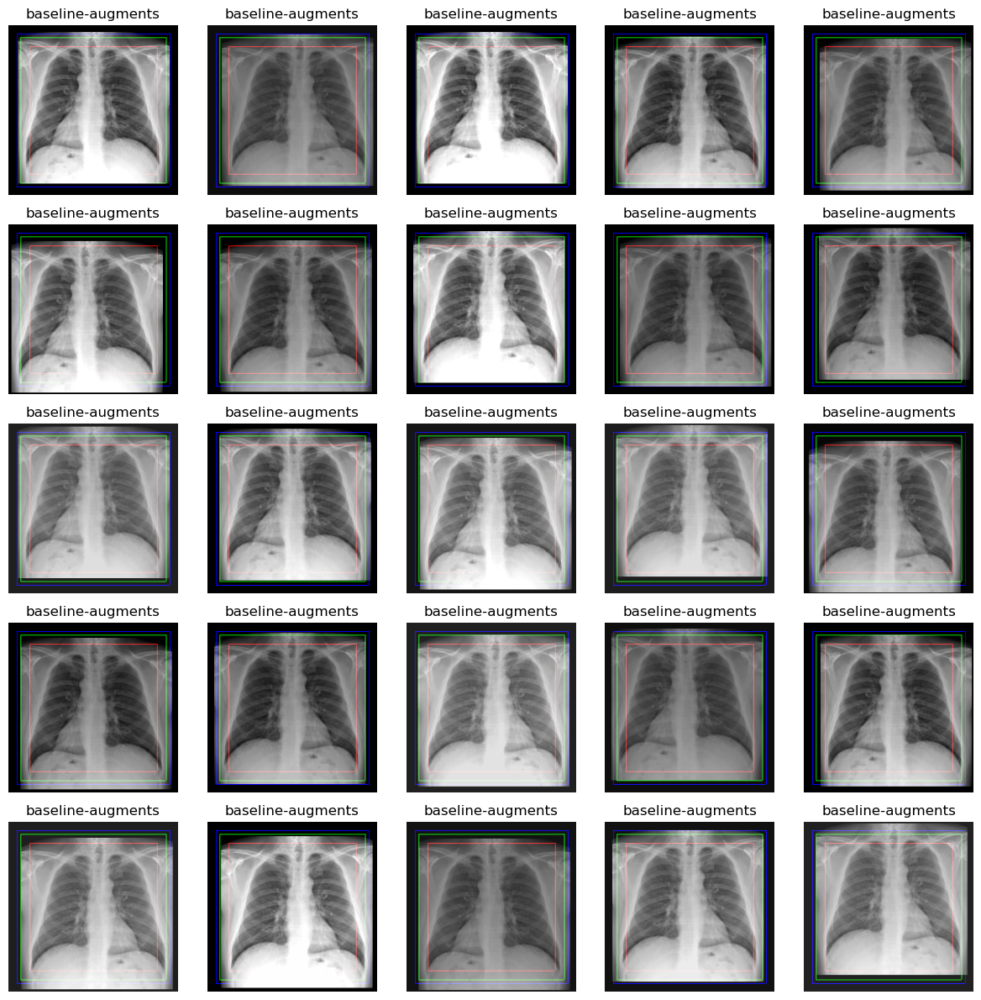

In [6]:
from covid_transforms import AUGMENTATION_SETUP
aug_name = 'baseline-augments'
aug = AUGMENTATION_SETUP[aug_name]

img, y, _, _ = pos_ds.__getitem__(0)
visualize_random_transform(img, aug, aug_name, get_preprocessing('crop_pad-0.9'), 5, 5)

In [7]:
intensity1 = 0.90
intensity2 = 0.85
intensity3 = 0.75


### BIMCV+

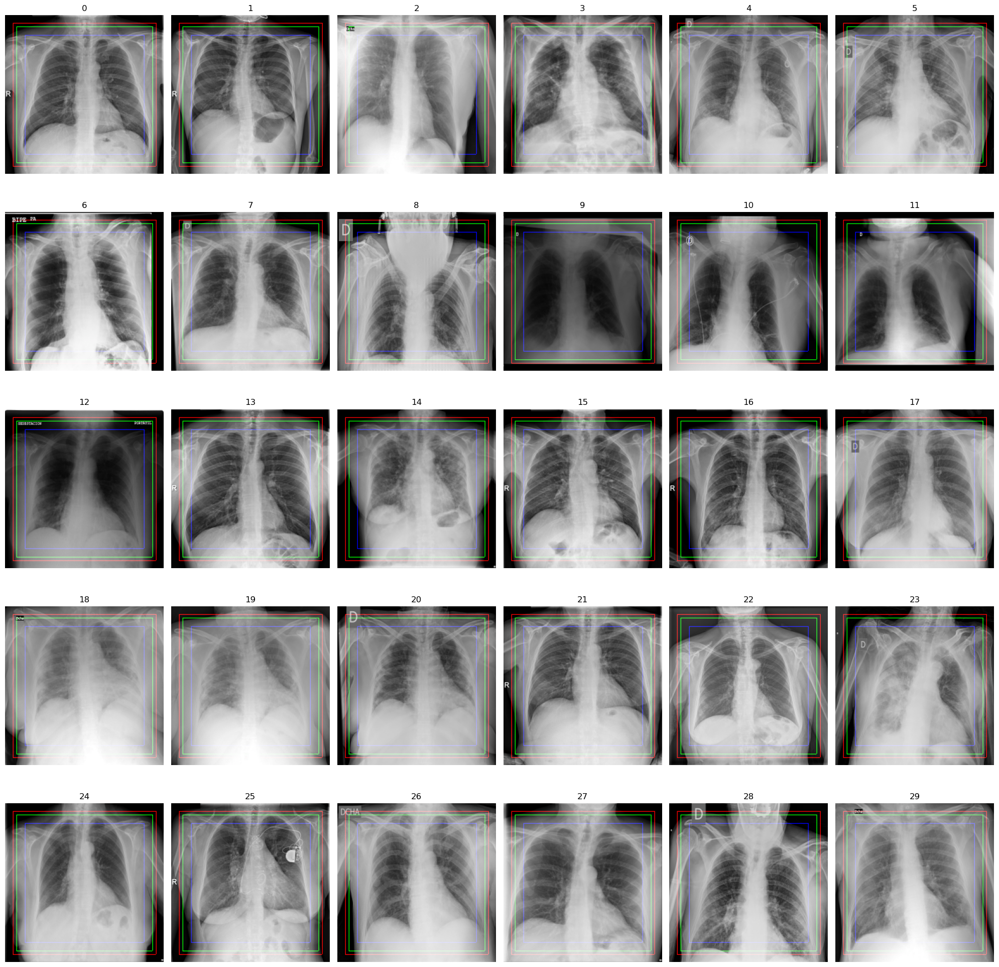

In [8]:
_, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()

# Show images from different datasets
for i in range(5 * 6):
    img, _, _, _ = pos_ds.__getitem__(i)
    show_image(example_borders(img, intensity1, intensity2, intensity3), i, axes[i])
plt.tight_layout()

### ChestXray14

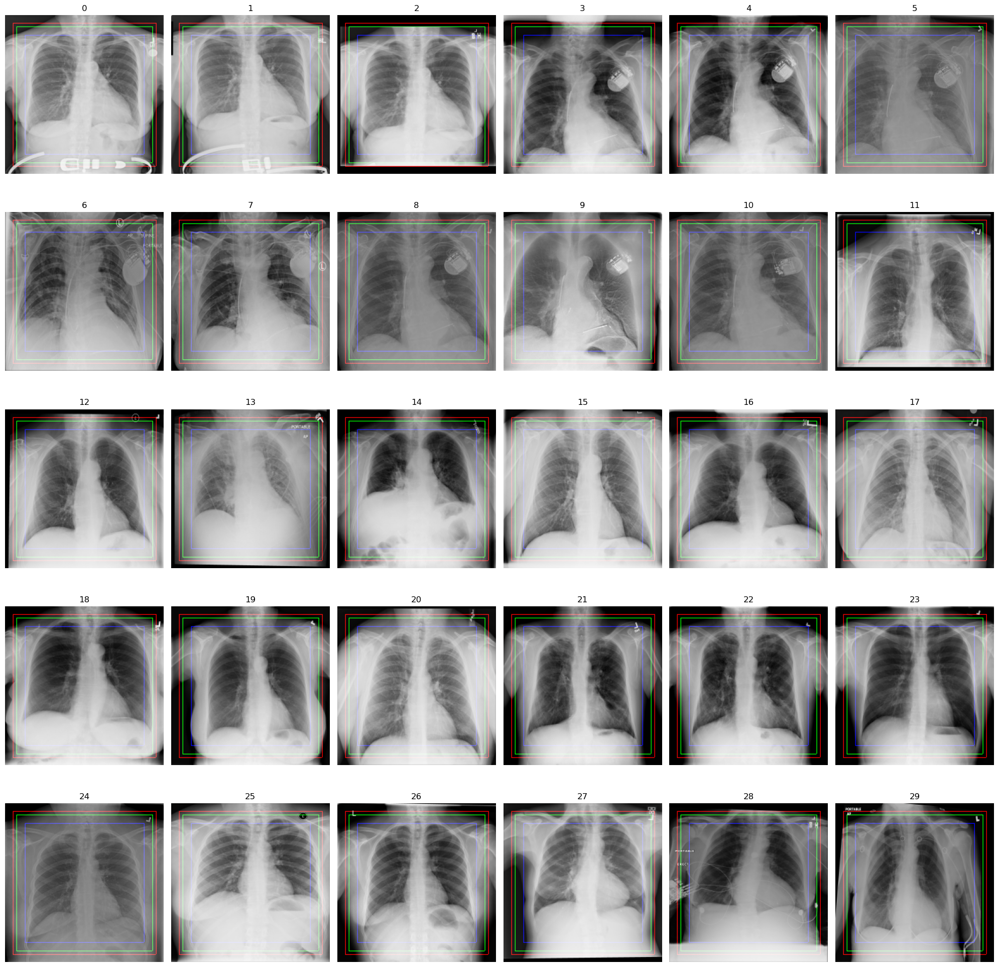

In [9]:
_, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()

# Show images from different datasets
for i in range(5 * 6):
    img, _, _, _ = chestxray14_ds.__getitem__(i)
    show_image(example_borders(img, intensity1, intensity2, intensity3), i, axes[i])

plt.tight_layout()

### GitHub Covid

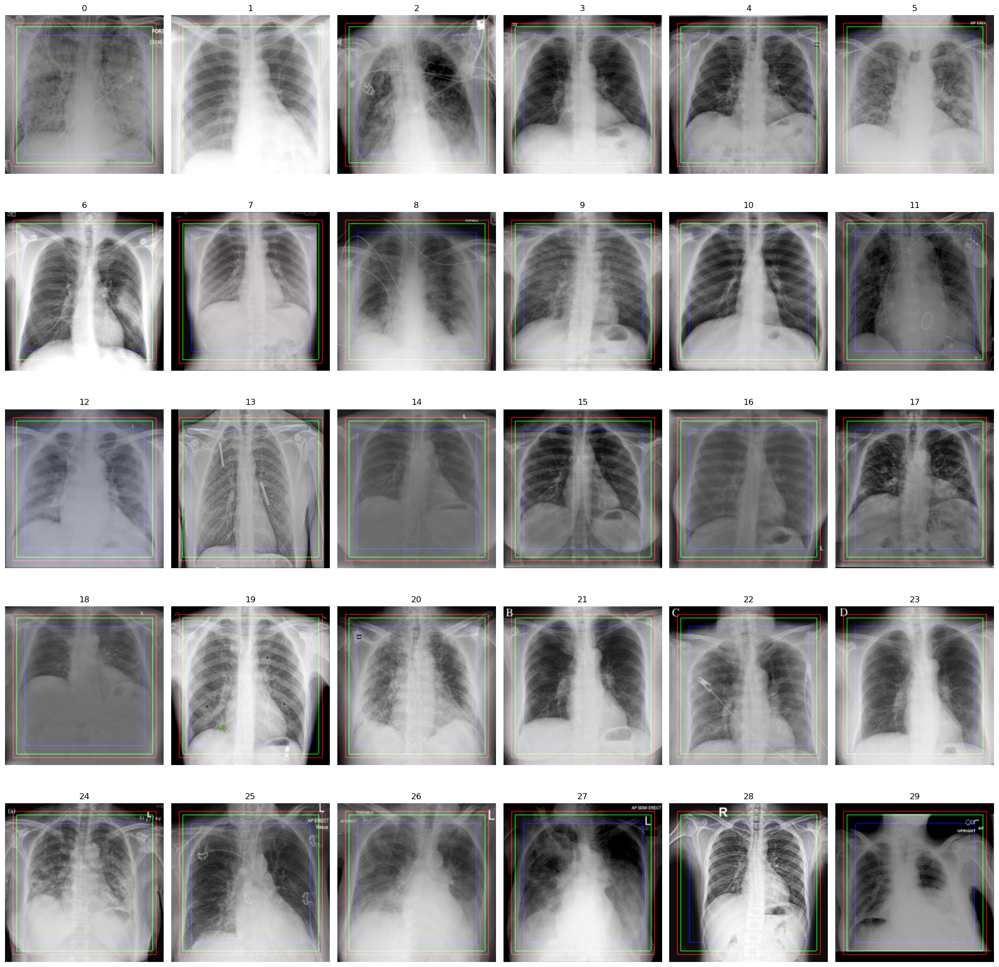

In [10]:
_, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()

# Show images from different datasets
for i in range(5 * 6):
    img, _, _, _ = github_ds.__getitem__(i)
    show_image(example_borders(img, intensity1, intensity2, intensity3), i, axes[i])

plt.tight_layout()

### PadChest

In [ ]:
_, axes = plt.subplots(5, 6, figsize=(20, 20))
axes = axes.ravel()

# Show images from different datasets
for i in range(5 * 6):
    img, _, _, _ = padchest_ds.__getitem__(i)
    show_image(example_borders(img, intensity1, intensity2, intensity3), i, axes[i])

plt.tight_layout()

## Wnioski o preprocessingu
### Czerwony
    1. Wycina najbardziej skrajne Spurious Correlations
    2. Sporo SC zostaje albo w całości albo w części. 
    3. Są anomalne przypaki, gdy już on zaczyna wycinać skrajne małe kawałki płuc, aczkolwiek nie jest to częste.
### Zielony
    1. Pomaga dociąć SC w częśc wycięte w 'czerwonym'
    2. Nadal wycina skrajne i małe kawałki płuc
### Niebieski
    1. Wycina zdecydowaną większość markerów lekarskich
    2. Zaczyna wycinać zewnętrzne krawędzie płuc, aczkolwiek nie jest to częste i dotyczy zewnętrznych krawędzi płuc.

Czerwony -> preprocessing
Zielony -> upper limit augmentacji średniej RandomCenterCrop (maksymalnie tyle może wyciąć)
Czerwony -> upper limit augmentacji silnej RandomCenterCrop (maksymalnie tyle może wyciąć)

słaba augmentacja nie robi RandomCenterCrop

### Weak preprocessing
    - RandomColorJitter + (0.2)
    - RandomCenterCrop -
    - ScaleJitter -
    - RandomRotation -
    - RandomHorizontalFlip +
    - RandomTranslate + (0.05 -> to border)

### Medium preprocessing
    - RandomColorJitter + (0.3)
    - RandomCenterCrop + (0.05 -> to green border max)
    - ScaleJitter -
    - RandomRotation -
    - RandomHorizontalFlip +
    - RandomTranslate + (0.05 -> to border)

### Strong preprocessing
    - RandomColorJitter + (0.3)
    - RandomCenterCrop + (0.10 -> to blue border max)
    - ScaleJitter + (1.1)
    - RandomRotation + (10)
    - RandomHorizontalFlip +
    - RandomTranslate + (0.1 -> to border)

Skip rotation and scale augmentations for weak and medium preprocessing, too small padding region to resonably combine with translation (without cutting out lungs).

# Visualize geometry of strong preprocessing
Strongest preprocessing and accepting that small regions will be cut out. 
Nonetheless make sure that only border regions are cut out and in reasonable proportions.


In [ ]:
from torchvision import transforms as v2
import torchvision.transforms.functional as F
from covid_transforms import NORMALIZED_BLACK, MEAN, STD
from monai.transforms import SpatialPad
from utils import denormalize

def scale_func(intensity):
    return v2.Compose([
        denormalize,
        v2.Lambda(lambda x: F.resize(x, int(224 * intensity))),
        v2.CenterCrop(224),
        SpatialPad(spatial_size=(224, 224)),
        v2.Normalize(MEAN, STD),
    ])

def combined(img, ints):
    return v2.Compose([
        v2.Lambda(lambda x: F.rotate(x, ints[1], fill=NORMALIZED_BLACK)),
        v2.Lambda(lambda x: F.affine(x, 0, (ints[0] * 224, ints[0] * 224), 1, 0, 0, fill=NORMALIZED_BLACK)),
        scale_func(ints[2]),
    ])(img)


Examples of worst case scenario augmentations with extreme samples (lungs closet to padding region),

Translation -> Rotation -> Scale.

Most of lungs is preserved with preprocessing strength kept high: 

translation = 0.1, rotation = 10, scale = 1.1

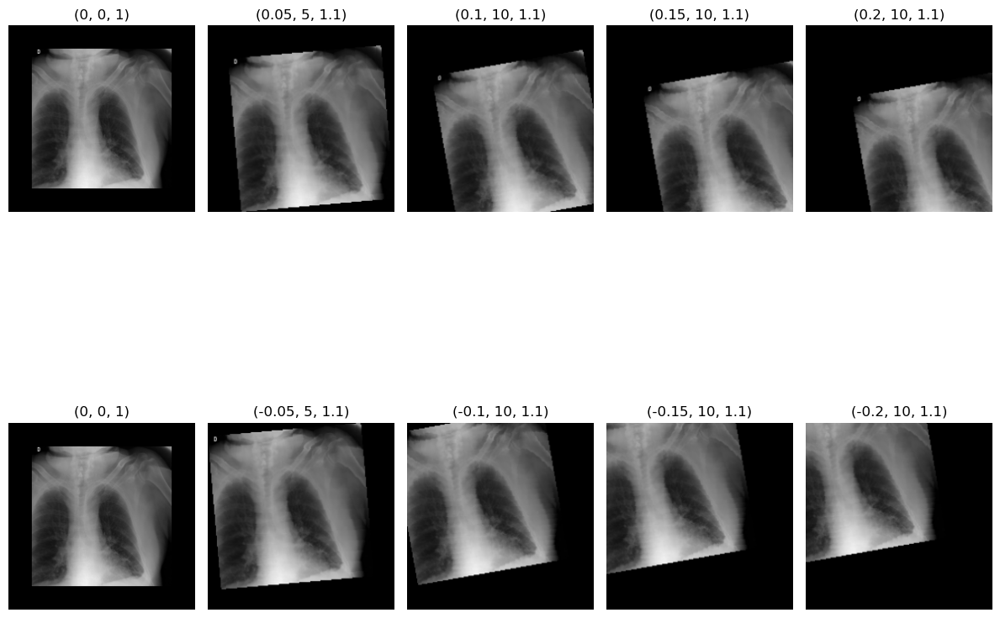

In [ ]:

img, y, _, _ = pos_ds.__getitem__(11)
strengths = [(0, 0, 1), (0.05, 5, 1.1), (0.1, 10, 1.1), (0.15, 10, 1.1), (0.2, 10, 1.1)]
values = strengths + [(-s[0], s[1], s[2]) for s in strengths]
visualize_deterministic_transform(img, combined, values, get_preprocessing('crop_pad-0.75'))

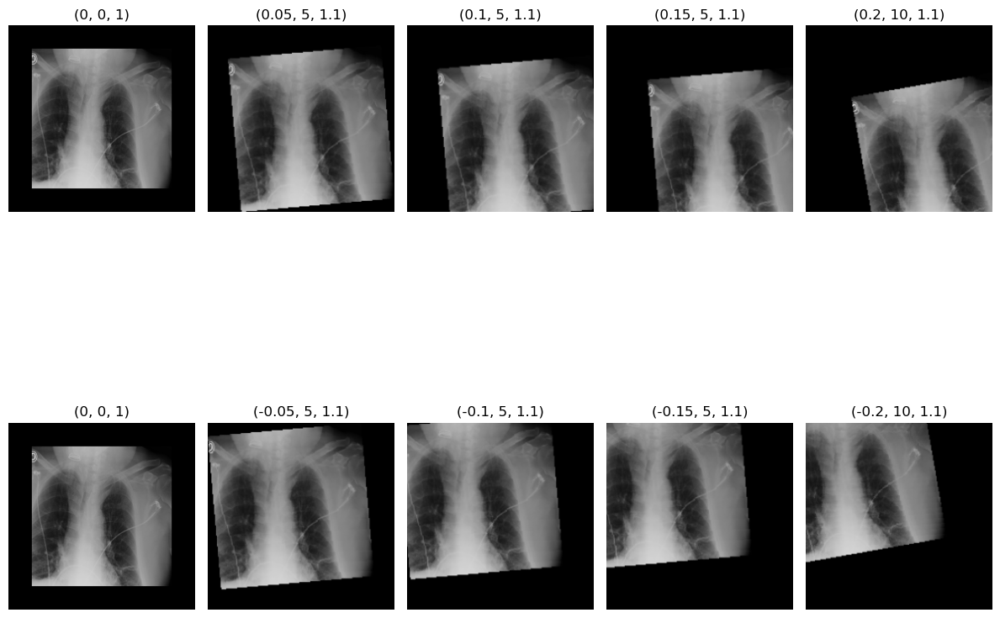

In [ ]:

img, y, _, _ = pos_ds.__getitem__(10)
strengths = [(0, 0, 1), (0.05, 5, 1.1), (0.1, 5, 1.1), (0.15, 5, 1.1), (0.2, 10, 1.1)]
values = strengths + [(-s[0], s[1], s[2]) for s in strengths]
visualize_deterministic_transform(img, combined, values, get_preprocessing('crop_pad-0.75'))

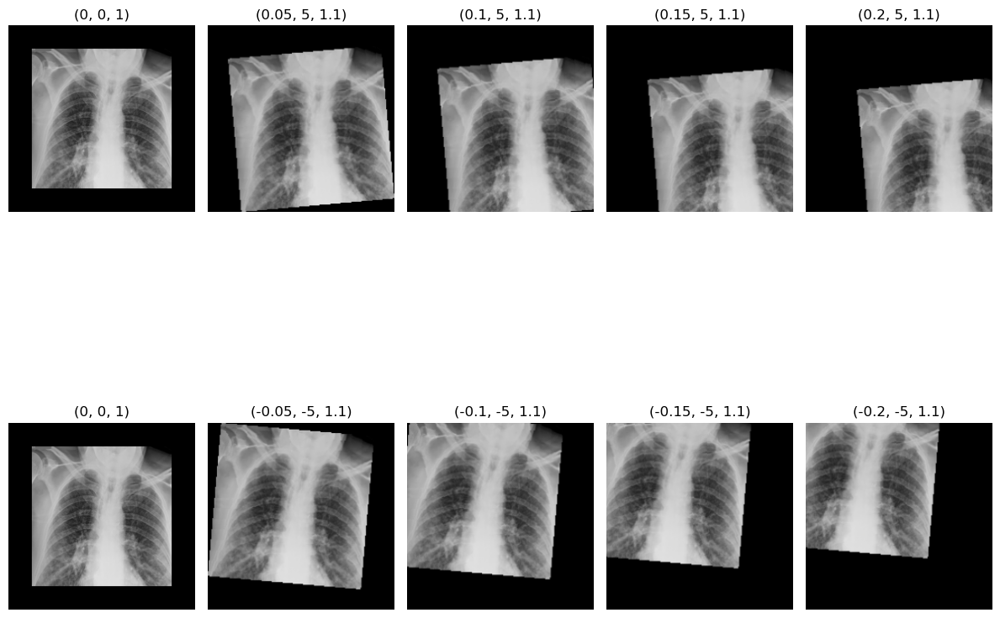

In [ ]:

img, y, _, _ = pos_ds.__getitem__(28)
strengths = [(0, 0, 1), (0.05, 5, 1.1), (0.1, 5, 1.1), (0.15, 5, 1.1), (0.2, 5, 1.1)]
values = strengths + [(-s[0], -s[1], s[2]) for s in strengths]
visualize_deterministic_transform(img, combined, values, get_preprocessing('crop_pad-0.75'))

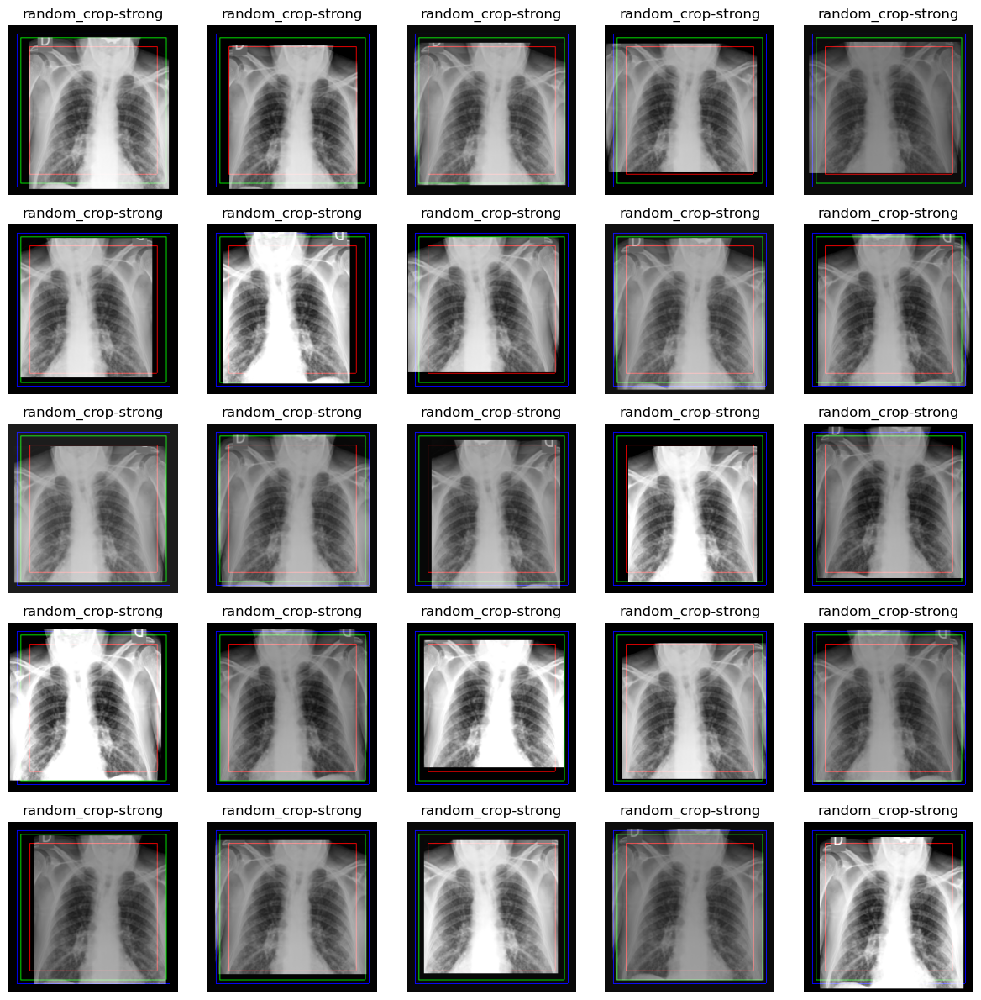

In [ ]:
from covid_transforms import AUGMENTATION_SETUP
aug_name = 'random_crop-strong'
aug = AUGMENTATION_SETUP['random_crop-strong']

img, y, _, _ = pos_ds.__getitem__(28)
visualize_random_transform(img, aug, 'random_crop-strong', get_preprocessing('crop_pad-0.9'), 5, 5)

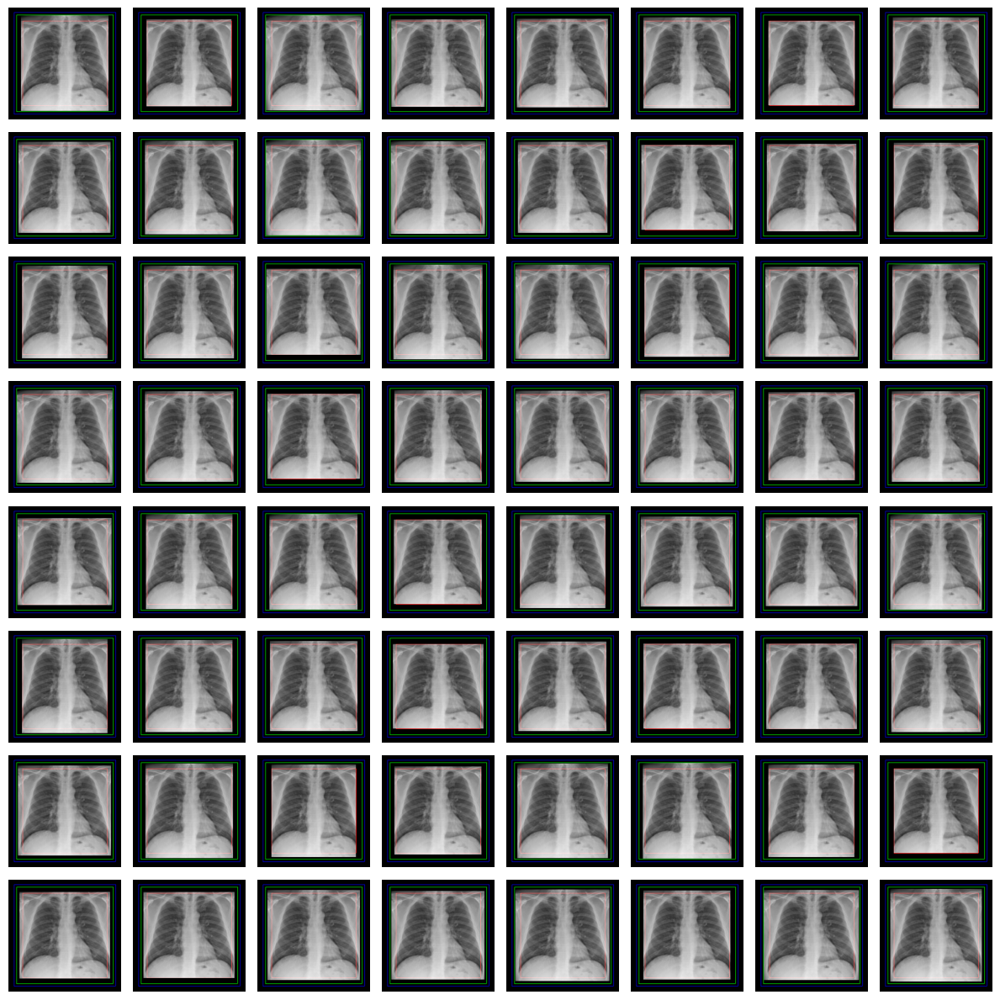

In [ ]:
from covid_transforms import AUGMENTATION_SETUP, get_transforms
aug_name = 'random_crop-strong-forced'
aug = get_transforms('crop', 'strong-forced')

img, y, _, _ = pos_ds.__getitem__(0)
visualize_random_transform(img, aug, "", get_preprocessing('crop_pad-0.9'), 8, 8)

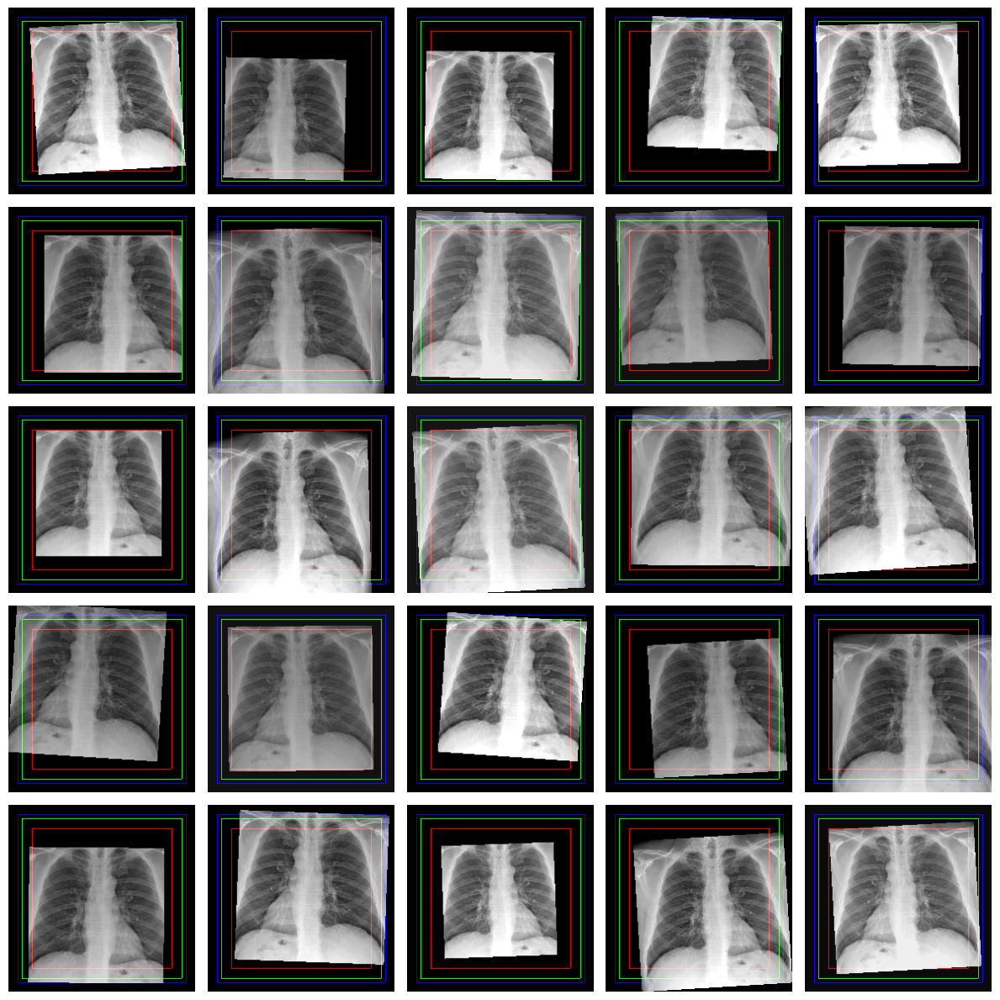

In [ ]:
from covid_transforms import AUGMENTATION_SETUP, get_transforms, RandomCenterCrop
aug_name = 'extreme_random_crop-affine'
aug = AUGMENTATION_SETUP[aug_name]

img, y, _, _ = pos_ds.__getitem__(0)
visualize_random_transform(img, aug, "", get_preprocessing('none'), 5, 5)